<a href="https://colab.research.google.com/github/Fronzilla/MarketingInfo/blob/main/TE_ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install datawig
!pip install impyute
!pip install --upgrade pandas
!pip install  missingpy

!pip install --upgrade sklearn
!pip install --upgrade pandas_profiling
!pip install --upgrade yellowbrick
!pip install dtreeviz
!pip install catboost 
!pip install shap

import sys
!{sys.executable} -m pip install -U pandas-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension



     |████████████████████████████████| 71kB 4.8MB/s 
     |████████████████████████████████| 7.1MB 4.7MB/s 
     |████████████████████████████████| 10.4MB 44.5MB/s 
     |████████████████████████████████| 29.6MB 116kB/s 
  Created wheel for datawig: filename=datawig-0.2.0-cp36-none-any.whl size=72677 sha256=7858e348e6ba57967245399ec8bc55ca8765757f06345275c2cb8ea2121124e4
  Stored in directory: /root/.cache/pip/wheels/85/07/ea/bd5addfefc4f04ba78700db67d77e59148c30b1be4ac34c157
Successfully built datawig
ERROR: google-colab 1.0.0 has requirement pandas~=1.1.0; python_version >= "3.0", but you'll have pandas 0.25.3 which is incompatible.
ERROR: fbprophet 0.7.1 has requirement pandas>=1.0.4, but you'll have pandas 0.25.3 which is incompatible.
ERROR: mxnet 1.4.0 has requirement numpy<1.15.0,>=1.8.2, but you'll have numpy 1.18.5 which is incompatible.
  Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-l

     |████████████████████████████████| 9.5MB 7.1MB/s 
ERROR: datawig 0.2.0 has requirement pandas==0.25.3, but you'll have pandas 1.1.4 which is incompatible.
  Found existing installation: pandas 0.25.3
    Uninstalling pandas-0.25.3:
      Successfully uninstalled pandas-0.25.3


     |████████████████████████████████| 51kB 3.6MB/s 
Requirement already up-to-date: sklearn in /usr/local/lib/python3.6/dist-packages (0.0)
     |████████████████████████████████| 266kB 8.6MB/s 
     |████████████████████████████████| 604kB 11.7MB/s 
     |████████████████████████████████| 71kB 6.8MB/s 
     |████████████████████████████████| 3.1MB 18.7MB/s 
     |████████████████████████████████| 71kB 7.9MB/s 
     |████████████████████████████████| 296kB 34.2MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp36-none-any.whl size=27085 sha256=0f89ae2421869c652d83e06b3982115825d8149f28519d9a2b0ceae758104ff5
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
Successfully built htmlmin
  Found existing installation: tqdm 4.41.1
    Uninstalling tqdm-4.41.1:
      Successfully uninstalled tqdm-4.41.1
  Found existing installation: pandas-profiling 1.4.1
    Uninstalling pandas-profiling-1.4.1:
      Successfully uninstall

In [3]:
import warnings
import pandas as pd
import pandas_profiling
import io
import requests
import numpy as np
import datawig
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import pydotplus
import graphviz
import xgboost as xgb 
import lightgbm as lgb
import catboost as ctb 
import statsmodels.stats.api as sms
import shap

from IPython.display import Image
from io import StringIO

from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.linear_model import BayesianRidge, LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor, export_graphviz
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor


from impyute.imputation.cs import fast_knn, mice
from missingpy import MissForest

from yellowbrick.features import JointPlotVisualizer
from yellowbrick.regressor import ResidualsPlot
from yellowbrick.model_selection import FeatureImportances

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.


In [4]:
warnings.filterwarnings('ignore')

sns.set(style='white', context='notebook', palette='deep')
%matplotlib inline

# Чтение данных <br>

*Глоссарий* <br>


*   ANNUAL_INCOME - Годовой доход бытового хозяйства ( либо личный доход, если человек одинокий)
            1. Менее 10 000 долларов США
            2. От 10 000 до 14 999 долларов США
            3. От 15 000 до 19 999 долларов США
            4. От 20 000 до 24 999 долларов США
            5. От 25 000 до 29 999 долларов США
            6. От 30 000 до 39 999 долларов США
            7. От 40 000 до 49 999 долларов США
            8. 50 000–74 999 долларов США
            9. 75 000 долларов США или больше
*   SEX - Пол: 
            1.Мужчина
            2.Женщина
*   MARITAL_STATUS - Семейный статус:
            1. Женат
            2.  Совместное проживание, не состоящее в браке
            3. Разведены или проживают отдельно
            4. Вдова
            5. Холост, никогда не был в браке
*   AGE - Возраст:
            1. 14–17
            2. 18–24
            3. 25–34
            4. 35–44
            5. 45–54
            6. 55–64
            7. 65 лет и старше
* EDUCATION - Образование:
            1. 8 класс или меньше
            2. 9–11 классы
            3. Окончил среднюю школу.
            4. От 1 до 3 лет в колледже
            5. Выпускник колледжа
            6. Grad Study
* OCCUPATION - Род занятости:
            1. Профессиональный / управленческий
            2. Торговый работник
            3. Заводской рабочий / чернорабочий / водитель
            4. Канцелярский работник / обслуживающий персонал
            5. Домохозяйка
            6. Студент, старшая школа или колледж
            7. Военный
            8. Пенсионер
            9. Безработный
* YEARS_LIVED ( *ориг.* HOW LONG HAVE YOU LIVED IN THE SAN FRAN./OAKLAND/SAN JOSE AREA? ) - Как долго человек жил в  Сан-Франциско, Окланде или Сан Хосе?
            1. Менее одного года
            2. От одного до трех лет
            3. Четыре-шесть лет
            4. От семи до десяти лет
            5. Более десяти лет
* DUAL INCOMES - Общий доход ( если в браке)
            1. Не женат
            2. Да
            3. Нет
* PERSONS_HOUSEHOLD ( *ориг.* PERSONS IN YOUR HOUSEHOLD) - Кол-во людей в доме
            1. Один
            2. Два
            3. Три
            4. Четыре
            5. Пять
            6. Шесть
            7. Семь
            8. Восемь
            9. Девять или больше
* PERSONS_HOUSEHOLD_UNDER_18 (*ориг.* PERSONS IN HOUSEHOLD UNDER 18)
            0. Нет
            1. Один
            2. Два
            3. Три
            4. Четыре
            5. Пять
            6. Шесть
            7. Семь
            8. Восемь
            9. Девять или больше
* HOUSEHOLDER STATUS ( Статус жилья ) 
            1. Собственное
            2. Аренда
            3. Живите с родителями / семьей

* TYPE OF HOME ( Тип жилья )
            1. Дом
            2. Кондоминиум
            3. Квартира
            4. Передвижной дом ( например трейлер)
            5. Другое

* ETHNIC CLASSIFICATION - Этническая принадлежность
            1. Американский индеец
            2. Азиат
            3. Афроамериканец 
            4. Индиец
            5. Латиноамериканец
            6. Житель тихоокенаских отсровов
            7. Белый
            8. Прочее
* LANGUAGE (*ориг.* WHAT LANGUAGE IS SPOKEN MOST OFTEN IN YOUR HOME? ) - На каком языке чаще всего говорят в вашем доме?
            1. Английский
            2. Испанский
            3. Другое






# 1. Прогнозирование уровня дохода 

In [5]:
url="https://web.stanford.edu/~hastie/ElemStatLearn/datasets/marketing.data"

cols = [
           'ANNUAL_INCOME', 
           'SEX', 
           'MARITAL_STATUS',
           'AGE',
           'EDUCATION', 
           'OCCUPATION', 
           'YEARS_LIVED',
           'DUAL_INCOMES', 
           'PERSONS_HOUSEHOLD',
           'PERSONS_HOUSEHOLD_UNDER_18',
           'HOUSEHOLDER_STATUS',
           'TYPE_OF_HOME',
           'ETHNIC_CLASSIFICATION',
           'LANGUAGE'
    ]

raw_data=pd.read_csv(
    io.StringIO(requests.get(url).content.decode('utf-8')),
    delim_whitespace=True,
    header=None,
    names = cols
    
)




In [6]:
start, *middle, end = cols
cols = [end, *middle, start]
data = raw_data[cols]

In [7]:
pandas_profiling.ProfileReport(data)

2020-12-02 03:14:10,625 [INFO]  NumExpr defaulting to 2 threads.


In [8]:
data.head()

,LANGUAGE,SEX,MARITAL_STATUS,AGE,EDUCATION,OCCUPATION,YEARS_LIVED,DUAL_INCOMES,PERSONS_HOUSEHOLD,PERSONS_HOUSEHOLD_UNDER_18,HOUSEHOLDER_STATUS,TYPE_OF_HOME,ETHNIC_CLASSIFICATION,ANNUAL_INCOME
0,NaN,2,1.0,5,4.0,5.0,5.0,3,3.0,0,1.0,1.0,7.0,9
1,1.0,1,1.0,5,5.0,5.0,5.0,3,5.0,2,1.0,1.0,7.0,9
2,1.0,2,1.0,3,5.0,1.0,5.0,2,3.0,1,2.0,3.0,7.0,9
3,1.0,2,5.0,1,2.0,6.0,5.0,1,4.0,2,3.0,1.0,7.0,1
4,1.0,2,5.0,1,2.0,6.0,3.0,1,4.0,2,3.0,1.0,7.0,1


In [9]:
data.describe()

,LANGUAGE,SEX,MARITAL_STATUS,AGE,EDUCATION,OCCUPATION,YEARS_LIVED,DUAL_INCOMES,PERSONS_HOUSEHOLD,PERSONS_HOUSEHOLD_UNDER_18,HOUSEHOLDER_STATUS,TYPE_OF_HOME,ETHNIC_CLASSIFICATION,ANNUAL_INCOME
count,8634.000000,8993.000000,8833.000000,8993.000000,8907.000000,8857.000000,8080.000000,8993.000000,8618.000000,8993.000000,8753.000000,8636.000000,8925.000000,8993.000000
mean,1.127519,1.546870,3.031020,3.415212,3.835074,3.787964,4.198267,1.544757,2.851822,0.666852,1.836742,1.855720,5.955854,4.895029
std,0.414411,0.497826,1.809343,1.637581,1.242391,2.544717,1.226254,0.739565,1.535914,1.083886,0.744396,1.145279,1.757631,2.773695
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000,2.000000,3.000000,1.000000,4.000000,1.000000,2.000000,0.000000,1.000000,1.000000,5.000000,2.000000
50%,1.000000,2.000000,3.000000,3.000000,4.000000,4.000000,5.000000,1.000000,3.000000,0.000000,2.000000,1.000000,7.000000,5.000000
75%,1.000000,2.000000,5.000000,4.000000,5.000000,6.000000,5.000000,2.000000,4.000000,1.000000,2.000000,3.000000,7.000000,7.000000
max,3.000000,2.000000,5.000000,7.000000,6.000000,9.000000,5.000000,3.000000,9.000000,9.000000,3.000000,5.000000,8.000000,9.000000


In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8993 entries, 0 to 8992
Data columns (total 14 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   LANGUAGE                    8634 non-null   float64
 1   SEX                         8993 non-null   int64  
 2   MARITAL_STATUS              8833 non-null   float64
 3   AGE                         8993 non-null   int64  
 4   EDUCATION                   8907 non-null   float64
 5   OCCUPATION                  8857 non-null   float64
 6   YEARS_LIVED                 8080 non-null   float64
 7   DUAL_INCOMES                8993 non-null   int64  
 8   PERSONS_HOUSEHOLD           8618 non-null   float64
 9   PERSONS_HOUSEHOLD_UNDER_18  8993 non-null   int64  
 10  HOUSEHOLDER_STATUS          8753 non-null   float64
 11  TYPE_OF_HOME                8636 non-null   float64
 12  ETHNIC_CLASSIFICATION       8925 non-null   float64
 13  ANNUAL_INCOME               8993 

# Пропущенные данные


Для анализа пропущенных данных построим гистограмму пропущен­ных данных, тепловую карту и дендрограмма

Стратегии работы с пропущенными данными:
 - Не делать ничего
 - Восстановить данные естественным путем ( открытые источники )
 - Отбросить записи с пропущенными элементами 
 - Заполнить пропущенные данные (нули, медиана, среднее, наиболее часто встречающаяся)
 - k-NN
 - MICE
 - MissForest 
 - IterativeImputer

In [11]:
data.isnull().values.any().any()

True

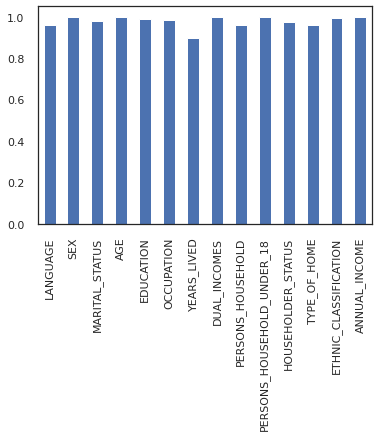

In [12]:
# гистограмму пропущен­ных данных. Используется для оценки того, ялвяется пропуск данных не является случайным
fig, ax = plt.subplots(figsize= (6, 4))
(1 - data.isnull().mean ()).abs().plot.bar(ax=ax)

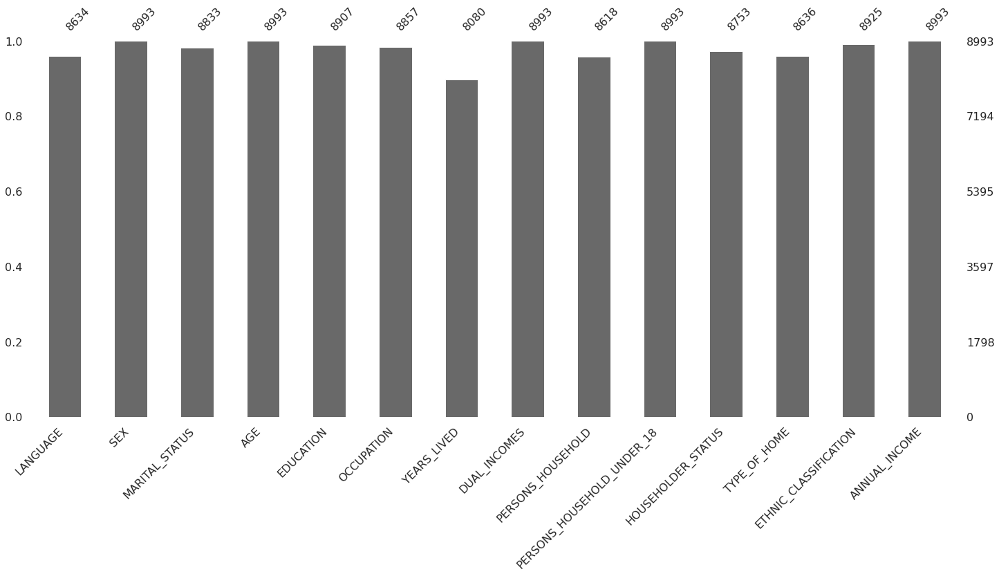

In [13]:
# Тот же самый график только через missingno 
msno.bar(data)

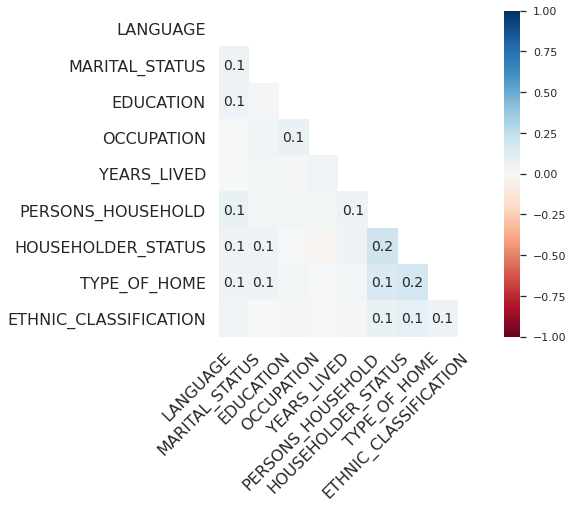

In [14]:
# Тепловая карта
msno.heatmap(data, figsize=(6, 6))

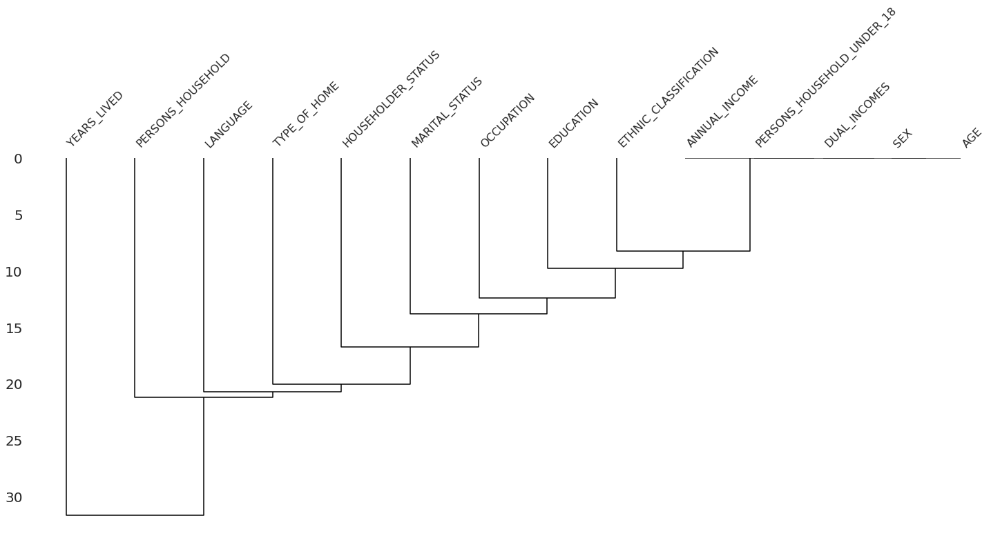

In [15]:
# Дендрограмма присутствующих и пропущенных данных.
msno.dendrogram(data)

**Отбросить пропущенные данные**



In [16]:
data_dropped_imputed = data.dropna()
data_dropped_imputed.isnull().values.any().any()

False

k-NN

In [17]:
# fast_knn и mice работают только с float.
sys.setrecursionlimit(100000)
data_knn_imputed=fast_knn(data.values, k=30)
data_knn_imputed = pd.DataFrame(data_knn_imputed, columns = cols)
data_knn_imputed.isnull().values.any().any()

False

MICE

In [18]:
data_mice_imputed=mice(data.values)
data_mice_imputed = pd.DataFrame(data_mice_imputed, columns= cols)
data_mice_imputed.isnull().values.any().any()

False

**Заполнить пропущенные данные**
<br>Наиболее встечающаяся  




In [19]:
imp_most_freq = SimpleImputer(strategy='most_frequent')
imp_most_freq.fit(data)
data_most_freq_imputed = imp_most_freq.transform(data)

data_most_freq_imputed = pd.DataFrame(data_most_freq_imputed, columns= cols)
data_most_freq_imputed = data_most_freq_imputed.convert_dtypes()
data_most_freq_imputed.isnull().values.any().any()

False

Среднее значение

In [20]:
imp_mean = SimpleImputer(strategy='mean') 
imp_mean.fit(data)
data_mean_imputed = imp_mean.transform(data)

data_mean_imputed = pd.DataFrame(data_mean_imputed, columns= cols)
data_mean_imputed.isnull().values.any().any()

False

MissForest

In [21]:
imputer = MissForest()
data_miss_forest_imuted = imputer.fit_transform(data)
data_miss_forest_imuted = pd.DataFrame(data_miss_forest_imuted, columns= cols)
data_miss_forest_imuted.isnull().values.any().any()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3


False

In [22]:
imputer = IterativeImputer(BayesianRidge())
data_iterative_imputer = pd.DataFrame(imputer.fit_transform(data))
data_iterative_imputer.isnull().values.any().any()

False

# EDA
Нулевая гипотеза - вероятнее всего доход зависит от образования, этнического происхождения и возраста?

In [23]:
# Для простоты эксперимента отбросим данные, в которых есть пропуски 
data.dropna(inplace=True)

In [24]:
#  Numeric features
numeric_features = ['AGE', 'ANNUAL_INCOME', 'YEARS_LIVED', 'PERSONS_HOUSEHOLD',
           'PERSONS_HOUSEHOLD_UNDER_18']

# Categorical features
cat_features = [cat for cat in cols if cat not in numeric_features]

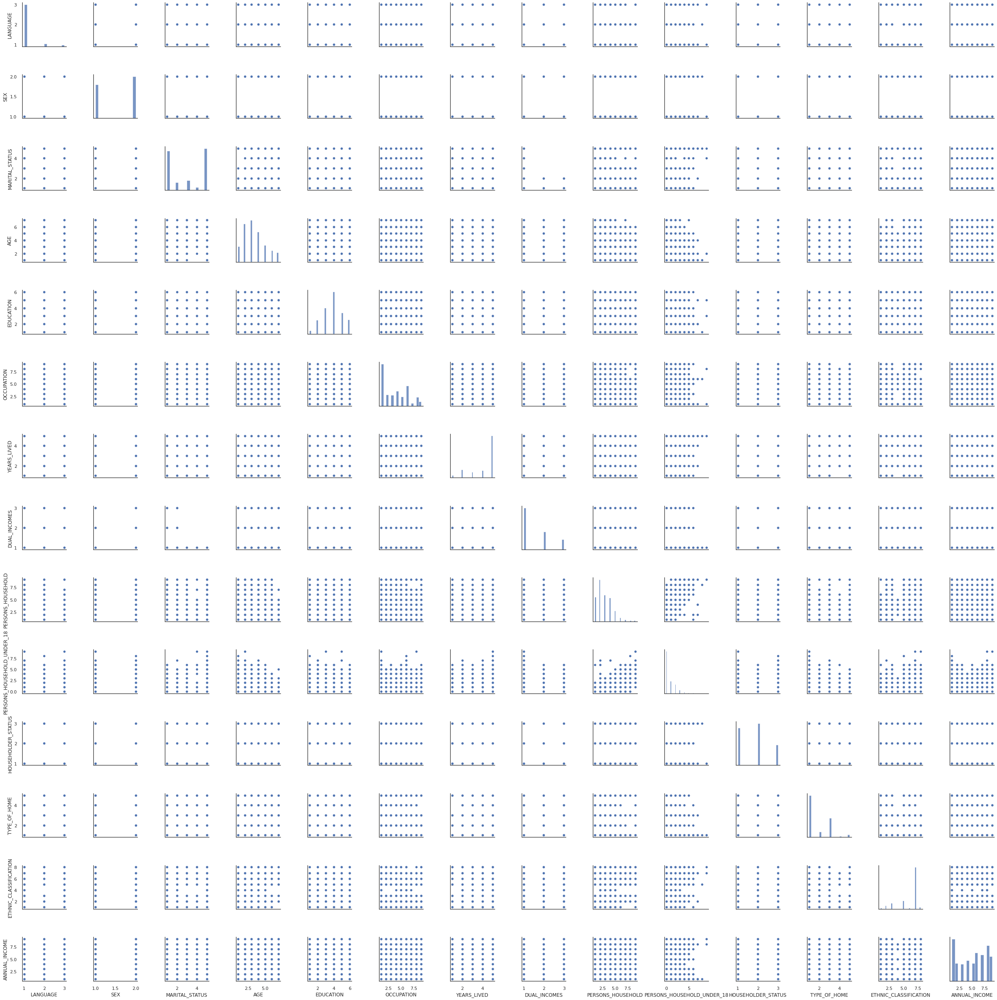

In [25]:
sns.pairplot(data)

Numeric

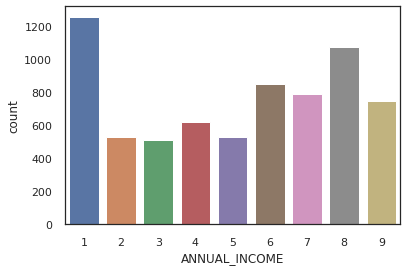

In [26]:
sns.countplot(data['ANNUAL_INCOME'],label="Count")
plt.show()

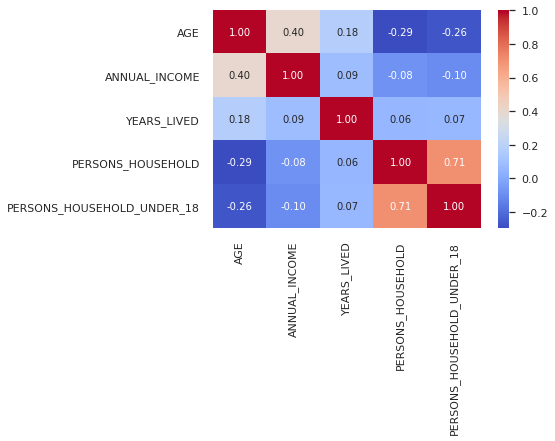

In [27]:
# Присутсвует положительная корреляция между между возрастом и годовым доходом 
g = sns.heatmap(data[numeric_features].astype(float).corr(), annot=True, fmt = ".2f", cmap = "coolwarm")
plt.show()

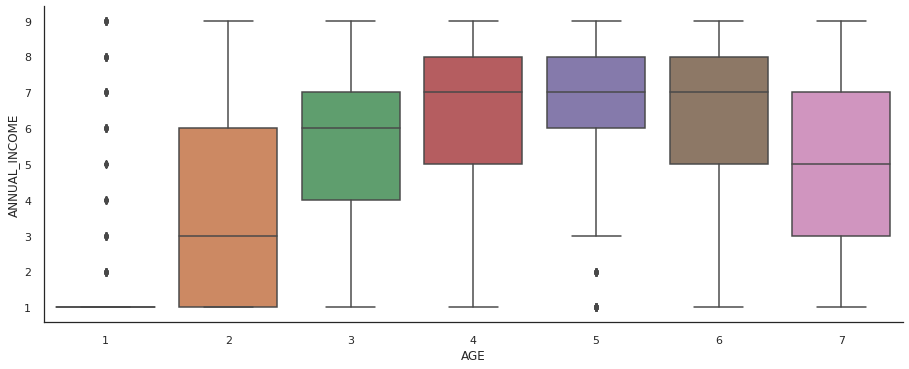

In [28]:
sns.factorplot(x="AGE",y="ANNUAL_INCOME",data=data,kind='box',aspect=2.5)

<Figure size 432x288 with 0 Axes>

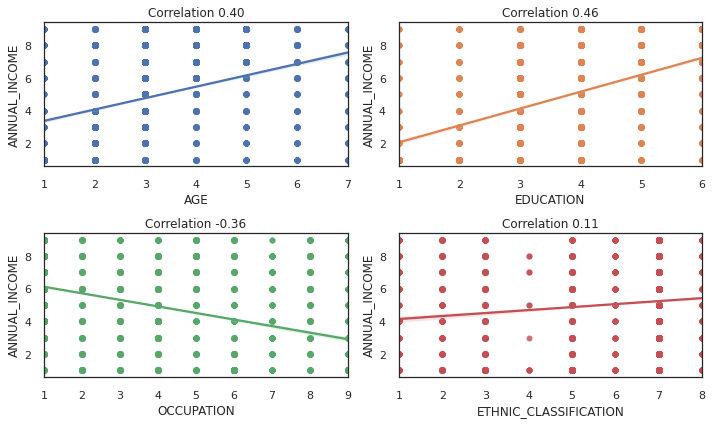

<Figure size 432x288 with 0 Axes>

In [29]:
def multiplot(data,features,plottype,nrows,ncols,figsize,y=None,colorize=False):
    n = 0
    plt.figure(1)
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    
    if colorize:
        colors = sns.color_palette(n_colors=(nrows*ncols))
    else :
        colors = [None]*(nrows*ncols)
        
    for row in range(ncols):
        for col in range(nrows):
            
            if plottype == 'regplot':
                if y == None:
                    raise ValueError('y value is needed with regplot type')
                
                sns.regplot(data = data, x = features[n], y = y ,ax=axes[row,col], color = colors[n])
                correlation = np.corrcoef(data[features[n]],data[y])[0,1]
                axes[row,col].set_title("Correlation {:.2f}".format(correlation))
            
            elif plottype == 'distplot':
                sns.distplot(a = data[features[n]],ax = axes[row,col],color=colors[n])
                skewness = data[features[n]].skew()
                axes[row,col].legend(["Skew : {:.2f}".format(skewness)])
            
            elif plottype in ['countplot']:
                g = sns.countplot(x = data[features[n]], y = y, ax = axes[row,col],color = colors[n])
                g = plt.setp(g.get_xticklabels(), rotation=45)
                
            n += 1
    plt.tight_layout()
    plt.show()
    plt.gcf().clear()

feats = ["AGE","EDUCATION","OCCUPATION", "ETHNIC_CLASSIFICATION"]

multiplot(data = data,features = feats,plottype = "regplot",nrows = 2, ncols = 2,
          figsize = (10,6),y = "ANNUAL_INCOME", colorize = True)

<Figure size 432x288 with 0 Axes>

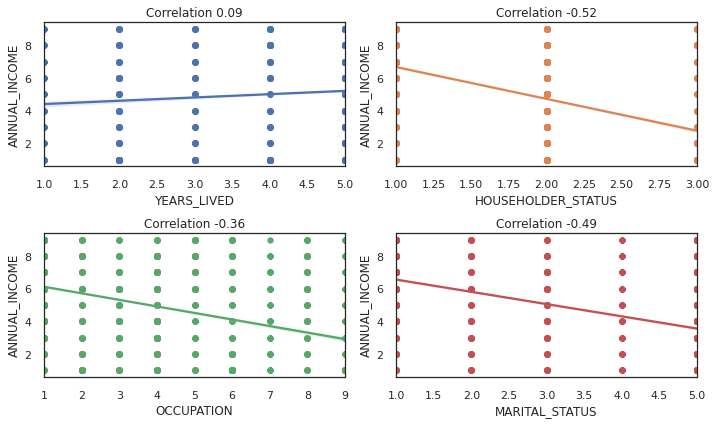

<Figure size 432x288 with 0 Axes>

In [30]:
feats = ["YEARS_LIVED","HOUSEHOLDER_STATUS","OCCUPATION", "MARITAL_STATUS"]

multiplot(data = data,features = feats,plottype = "regplot",nrows = 2, ncols = 2,
          figsize = (10,6),y = "ANNUAL_INCOME", colorize = True)

<Figure size 432x288 with 0 Axes>

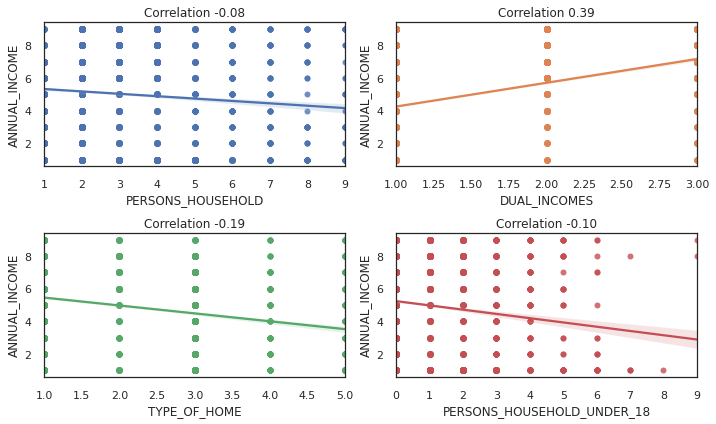

<Figure size 432x288 with 0 Axes>

In [31]:
feats = ["PERSONS_HOUSEHOLD","DUAL_INCOMES","TYPE_OF_HOME", "PERSONS_HOUSEHOLD_UNDER_18"]

multiplot(data = data,features = feats,plottype = "regplot",nrows = 2, ncols = 2,
          figsize = (10,6),y = "ANNUAL_INCOME", colorize = True)

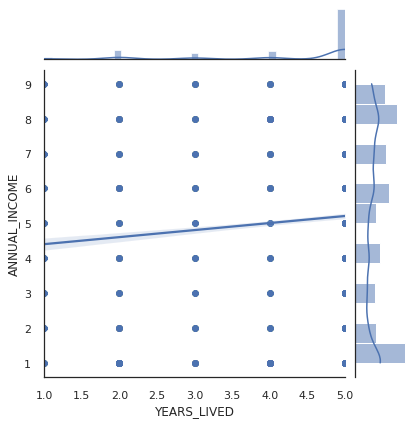

In [32]:
g = sns.jointplot(x = data['YEARS_LIVED'], y = data['ANNUAL_INCOME'],kind="reg")

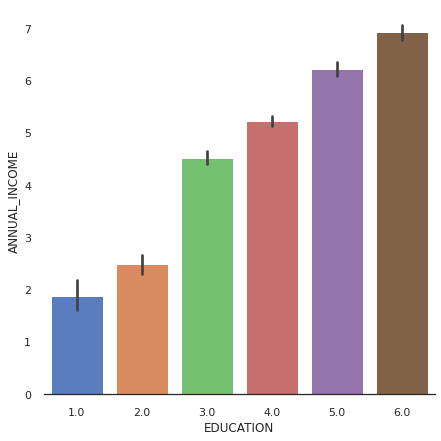

In [33]:
# Education vs Income 
g = sns.factorplot(x="EDUCATION",y="ANNUAL_INCOME",data=data,kind="bar",size = 6,palette = "muted")
g.despine(left=True)
g = g.set_ylabels("ANNUAL_INCOME") 

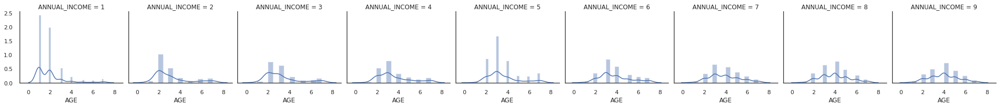

In [34]:
# Age vs Income
g = sns.FacetGrid(data, col='ANNUAL_INCOME')
g = g.map(sns.distplot, "AGE")
plt.show()

Categorical Data Analysis

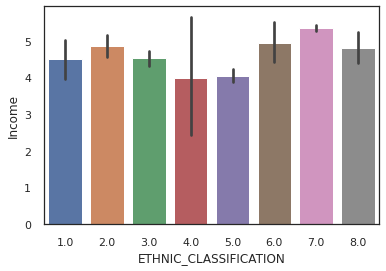

In [35]:
#  Ethnic classification vs Income
g = sns.barplot(x="ETHNIC_CLASSIFICATION",y="ANNUAL_INCOME",data=data)
g = g.set_ylabel("Income")
plt.show()

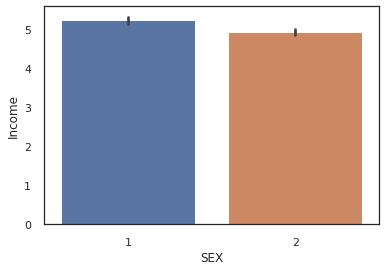

In [36]:
# Sex vs Income
g = sns.barplot(x="SEX",y="ANNUAL_INCOME",data=data)
g = g.set_ylabel("Income")
plt.show()

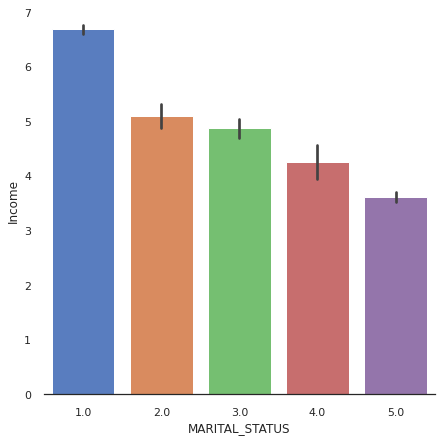

In [37]:
# Martial status vs Income 
g = sns.factorplot(x="MARITAL_STATUS",y="ANNUAL_INCOME",data=data,kind="bar", size = 6 ,
palette = "muted")
g.despine(left=True)
g = g.set_ylabels("Income")
plt.show()

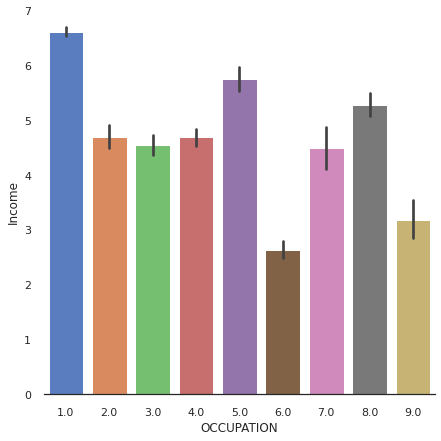

In [38]:
# Occupation vs Income
g = sns.factorplot(x="OCCUPATION",y="ANNUAL_INCOME",data=data,kind="bar", size = 6 ,
palette = "muted")
g.despine(left=True)
g = g.set_ylabels("Income")
plt.show()

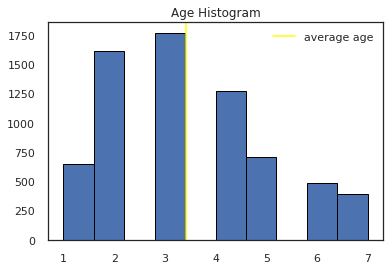

In [39]:
plt.hist(data['AGE'], edgecolor='black')
plt.title('Age Histogram')
plt.axvline(np.mean(data['AGE']), color='yellow', label='average age')
plt.legend()

Годовой доход тесно связан с такими предикторами, как образование, наличие общего дохода, возраст. Факторы, которые имеют не очень сильное влияние - Продолжительность жизни, пол, количество членов семьи и лиц младше 18 лет, а также этническая принадлежность и язык не влияют на годовой доход

#Модели

In [40]:
X, y = data.iloc[:, : -1], data.iloc[:, -1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

## Базовая модель
Линейная регрессия

In [41]:
lr = LinearRegression()
lr.fit(X_train, y_train)
lr.score(X_test, y_test), lr.intercept_, lr.coef_

(0.46079460905290504,
 5.243371456136456,
 array([-0.12283095, -0.32266676, -0.26224721,  0.10356964,  0.52865457,
        -0.23248989,  0.09773628,  0.30773932,  0.13361721, -0.07820065,
        -0.69130313, -0.2739644 ,  0.04266185]))

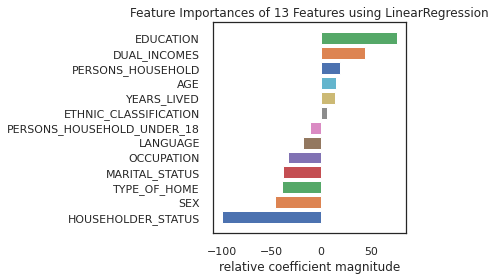

In [42]:
fig , ax = plt.subplots(figsize=(6, 4))
fi_viz = FeatureImportances(
    lr, labels=X.columns
)

fi_viz.fit (X, y)
fi_viz.poof()

##SVR


In [43]:
svr = SVR()
svr.fit(X_train, y_train)
svr.score(X_test, y_test)

0.4751656782341545

# KNN 

In [44]:
knr = KNeighborsRegressor()
knr.fit(X_train,y_train)
knr.score(X_test, y_test)

0.44735185374623343

# Decision Tree

In [45]:
dtr = DecisionTreeRegressor(random_state=42)
dtr.fit(X_train, y_train)
dtr.score(X_test, y_test)

0.09715830426785743

In [46]:

# интерпритация дерева 
display(graphviz.Source(export_graphviz(dtr)))

In [47]:
# Важность признаков Decision Tree
for col, val in sorted(
    zip(X.columns, dtr.feature_importances_),
    key=lambda x: x[1], reverse=True)[:5]:
      print(f"{col:10}{val:10.3f}")

HOUSEHOLDER_STATUS     0.264
OCCUPATION     0.146
AGE            0.142
MARITAL_STATUS     0.075
EDUCATION      0.067


# Random Forest

In [48]:
rfr = RandomForestRegressor(n_estimators=100)
rfr.fit(X_train, y_train)
dtr.score(X_test, y_test)

0.09715830426785743

In [49]:
# Важность признаков Random Forest 
for col, val in sorted(
    zip(X.columns, rfr.feature_importances_),
    key=lambda x: x[1], reverse=True)[:5]:
      print(f"{col:10}{val:10.3f}")

HOUSEHOLDER_STATUS     0.253
OCCUPATION     0.153
AGE            0.134
MARITAL_STATUS     0.074
EDUCATION      0.072


# XGBoost


In [50]:
xgr = xgb.XGBRegressor(random_state=42)
xgr.fit(X_train, y_train)
xgr.score(X_test, y_test)

[03:18:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


0.5325933209299683

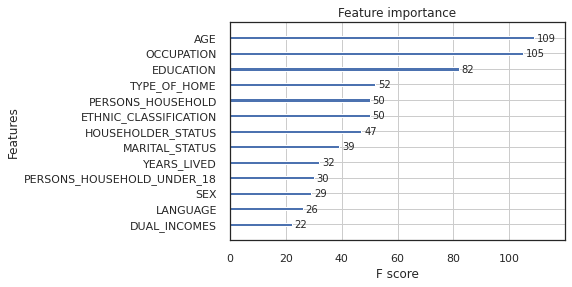

In [51]:
fig, ax = plt.subplots(figsize=(6, 4))
xgb.plot_importance(xgr, ax=ax)

# LightGBM


In [52]:
lgr = lgb.LGBMRegressor(random_state=42)
lgr.fit(X_train, y_train)
lgr.score(X_test, y_test)

0.5258565187271307

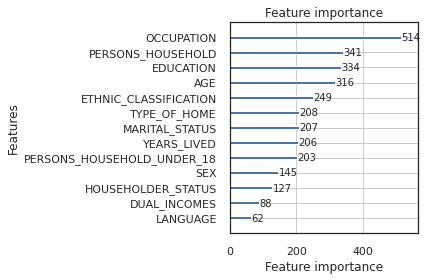

In [53]:
fig , ax= plt.subplots(figsize=(6, 4))
lgb.plot_importance(lgr, ax=ax)
fig.tight_layout()

# Catboost

In [54]:
cbtr = ctb.CatBoostRegressor()
cbtr.fit(X_train, y_train)
cbtr.score(X_test, y_test)

Learning rate set to 0.051224
0:	learn: 2.7145181	total: 48.2ms	remaining: 48.2s
1:	learn: 2.6570837	total: 49.9ms	remaining: 24.9s
2:	learn: 2.6049191	total: 51.3ms	remaining: 17.1s
3:	learn: 2.5568980	total: 52.7ms	remaining: 13.1s
4:	learn: 2.5110019	total: 54.1ms	remaining: 10.8s
5:	learn: 2.4706802	total: 55.4ms	remaining: 9.18s
6:	learn: 2.4319315	total: 56.7ms	remaining: 8.05s
7:	learn: 2.3956114	total: 58.1ms	remaining: 7.2s
8:	learn: 2.3641048	total: 59.5ms	remaining: 6.55s
9:	learn: 2.3349696	total: 60.8ms	remaining: 6.02s
10:	learn: 2.3058414	total: 62.2ms	remaining: 5.59s
11:	learn: 2.2810123	total: 63.5ms	remaining: 5.23s
12:	learn: 2.2558710	total: 64.9ms	remaining: 4.92s
13:	learn: 2.2336123	total: 66.1ms	remaining: 4.66s
14:	learn: 2.2131623	total: 67.3ms	remaining: 4.42s
15:	learn: 2.1930655	total: 68.6ms	remaining: 4.22s
16:	learn: 2.1756085	total: 70ms	remaining: 4.04s
17:	learn: 2.1568652	total: 71.3ms	remaining: 3.89s
18:	learn: 2.1425223	total: 72.6ms	remaining: 3

0.5243528275811647

In [55]:
y_pred_catboost = cbtr.predict(X_test)
metrics.mean_absolute_error(y_test, y_pred_catboost), metrics.mean_squared_error(y_test, y_pred_catboost), metrics.r2_score(y_test, y_pred_catboost)

(1.435213713218325, 3.651784789283415, 0.5243528275811647)

# GridSearch

In [56]:
param_grid = {'objective':['reg:linear'],
              'learning_rate': [0.02,0.03,0.04], 
              'max_depth': [1,2],
              'min_child_weight': [2,3,4],
              'silent': [1],
              'subsample': [0.8],
              'colsample_bytree': [0.2,0.3,0.4],
              'n_estimators': [50,60,70,100]}

xgb_reg = xgb.XGBRegressor()

xgb_grid_search = GridSearchCV(xgb_reg, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=1, n_jobs=4)
xgb_grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 216 candidates, totalling 1080 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    4.1s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:   14.8s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:   32.9s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:   58.7s
[Parallel(n_jobs=4)]: Done 1080 out of 1080 | elapsed:  1.4min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                    colsample_bylevel=1, colsample_bynode=1,
                                    colsample_bytree=1, gamma=0,
                                    importance_type='gain', learning_rate=0.1,
                                    max_delta_step=0, max_depth=3,
                                    min_child_weight=1, missing=None,
                                    n_estimators=100, n_jobs=1, nthread=None,
                                    objective='reg:linear', random_state=0,
                                    reg_alpha=0, reg_...
                                    subsample=1, verbosity=1),
             iid='deprecated', n_jobs=4,
             param_grid={'colsample_bytree': [0.2, 0.3, 0.4],
                         'learning_rate': [0.02, 0.03, 0.04],
                         'max_depth': [1, 2], 'min_child_weight': [2, 3, 4],
                    

In [57]:
y_pred_grid_search_xgb = xgb_grid_search.predict(X_test)
metrics.mean_absolute_error(y_test, y_pred_grid_search_xgb), metrics.mean_squared_error(y_test, y_pred_grid_search_xgb), metrics.r2_score(y_test, y_pred_grid_search_xgb)

(1.5773048693388043, 3.910116099297264, 0.4907050185657128)

In [58]:
param_grid = [
              {
                  'bootstrap': [False, True],
                  'n_estimators': [75,100,125,150,200], 
                  'max_features':[1,2,4,6]
               }
          ]
forest_reg = RandomForestRegressor()
grid_search_forest = GridSearchCV(forest_reg, param_grid, cv=5, scoring='neg_mean_squared_error', return_train_score=True)
grid_search_forest.fit(X_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                             criterion='mse', max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             max_samples=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators=100, n_jobs=None,
                                             oob_score=False, random_state=None,
                                             verbose=0, warm_start=False),
             iid='deprecated', n_jo

In [59]:
grid_search_forest.best_params_, grid_search_forest.best_estimator_

({'bootstrap': True, 'max_features': 2, 'n_estimators': 200},
 RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                       max_depth=None, max_features=2, max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=200, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False))

In [60]:
y_pred_grid_search_forest = grid_search_forest.predict(X_test)
metrics.mean_absolute_error(y_test, y_pred_grid_search_forest), metrics.mean_squared_error(y_test, y_pred_grid_search_forest), metrics.r2_score(y_test, y_pred_grid_search_forest)

(1.4750393865571776, 3.8997942216020967, 0.49204944936409034)

 # Pipeline: XGBRegressor + PCA + EarlyStop





In [61]:
class XGBoostWithEarlyStop(BaseEstimator):
    def __init__(self, early_stopping_rounds=5, test_size=0.1, 
                 eval_metric='mae', **estimator_params):
        self.early_stopping_rounds = early_stopping_rounds
        self.test_size = test_size
        self.eval_metric=eval_metric='mae'        
        if self.estimator is not None:
            self.set_params(**estimator_params)

    def set_params(self, **params):
        return self.estimator.set_params(**params)

    def get_params(self, **params):
        return self.estimator.get_params()

    def fit(self, X, y):
        x_train, x_val, y_train, y_val = train_test_split(X, y, test_size=self.test_size)
        self.estimator.fit(x_train, y_train, 
                           early_stopping_rounds=self.early_stopping_rounds, 
                           eval_metric=self.eval_metric, eval_set=[(x_val, y_val)])
        return self

    def predict(self, X):
        return self.estimator.predict(X)

class XGBoostRegressorWithEarlyStop(XGBoostWithEarlyStop):
    def __init__(self, *args, **kwargs):
        self.estimator = xgb.XGBRegressor()
        super(XGBoostRegressorWithEarlyStop, self).__init__(*args, **kwargs)

In [62]:
pipe = Pipeline([
    ('pca', PCA(5)),
    ('xgb', XGBoostRegressorWithEarlyStop())
])

param_grid = {
    'pca__n_components': [3, 5, 7],
    'xgb__n_estimators': [10, 20, 30, 50]
}

grid = GridSearchCV(pipe, param_grid, scoring='neg_mean_absolute_error')
grid.fit(X_train, y_train)
print(grid.best_params_)

[03:22:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-mae:3.73778
Will train until validation_0-mae hasn't improved in 5 rounds.
[1]	validation_0-mae:3.40063
[2]	validation_0-mae:3.13375
[3]	validation_0-mae:2.9145
[4]	validation_0-mae:2.73364
[5]	validation_0-mae:2.5801
[6]	validation_0-mae:2.45702
[7]	validation_0-mae:2.3462
[8]	validation_0-mae:2.25497
[9]	validation_0-mae:2.17778
[03:22:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-mae:4.14314
Will train until validation_0-mae hasn't improved in 5 rounds.
[1]	validation_0-mae:3.76896
[2]	validation_0-mae:3.46046
[3]	validation_0-mae:3.19991
[4]	validation_0-mae:2.98767
[5]	validation_0-mae:2.80244
[6]	validation_0-mae:2.64592
[7]	validation_0-mae:2.51735
[8]	validation_0-mae:2.39943
[9]	validation_0-mae:2.29995
[03:22:30] WARNING: /workspace/src/objectiv

In [63]:
y_pred_grid = grid.predict(X_test)

In [64]:
grid.score(X_test, y_test)

-1.5552279938685212

In [65]:
metrics.mean_absolute_error(y_test, y_pred_grid), metrics.mean_squared_error(y_test, y_pred_grid), metrics.r2_score(y_test, y_pred_grid)

(1.5552279938685212, 3.8443323264226423, 0.4992733946788618)

In [66]:
d = {
  'mean_absolute_error':[metrics.mean_absolute_error(y_test, y_pred_grid_search_xgb), metrics.mean_absolute_error(y_test, y_pred_grid_search_forest), metrics.mean_absolute_error(y_test, y_pred_grid)], 
  'mean_squared_error': [metrics.mean_squared_error(y_test, y_pred_grid_search_xgb), metrics.mean_squared_error(y_test, y_pred_grid_search_forest), metrics.mean_squared_error(y_test, y_pred_grid)], 
  'r2_score':[metrics.r2_score(y_test, y_pred_grid_search_xgb), metrics.r2_score(y_test, y_pred_grid_search_forest), metrics.r2_score(y_test, y_pred_grid)]
}

pd.DataFrame(
    d, 
    index=[
    'XGBRegressor GrideSearch',
    'RandomForestRegressor GrideSearch',
    'XGBRegressor + PCA + EarlyStop'
    ]
)


,mean_absolute_error,mean_squared_error,r2_score
XGBRegressor GrideSearch,1.577305,3.910116,0.490705
RandomForestRegressor GrideSearch,1.475039,3.899794,0.492049
XGBRegressor + PCA + EarlyStop,1.555228,3.844332,0.499273


### Объяснение модели

In [67]:
# За основу возьмем любую древовидную модель
shap.initjs()

exp = shap.TreeExplainer(xgr)
vals = exp.shap_values(X)
shap.force_plot(
    exp.expected_value,
    vals[5],
    X.iloc[5]
)

# 2. Прогнозирование рода занятости
Сокращенная версия, логика такая же как и в первом пункте  

In [68]:
y = data.iloc[:, 5]
X = data.copy().drop(columns = ['OCCUPATION'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# Keras

In [69]:
def model():
	model = Sequential()
	model.add(Dense(20, input_dim=13, kernel_initializer='normal', activation='relu'))
	model.add(Dense(1, kernel_initializer='normal'))
	model.compile(loss='mean_squared_error', optimizer='adam')
	return model


estimators = []
estimators.append(('mlp', KerasRegressor(build_fn=model, epochs=100, batch_size=5, verbose=0)))
pipeline = Pipeline(estimators)
kfold = KFold(n_splits=10)
results = cross_val_score(pipeline, X_train, y_train, cv=kfold)
print("Model: %.2f (%.2f) MSE" % (results.mean(), results.std()))

Model: -3.96 (0.23) MSE


In [71]:
pipeline.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('mlp',
                 <tensorflow.python.keras.wrappers.scikit_learn.KerasRegressor object at 0x7f91ec95cc18>)],
         verbose=False)

In [82]:
pipeline.predict(X_test.iloc[[2]])

array(2.9924455, dtype=float32)